In [1]:
from pathlib import Path

from adain_model import AdaINModel, AdaINLoss
from adain_datamodule import AdaINDataModule
from adain_trainer import AdaINTrainer

import keras

In [2]:
run_id = '960f62db65c64346b576b5318838c375'
train_epochs = 1
start_epoch = 1
dataset_size = 100000
lr = 1e-4
decay_rate = 5e-5
style_loss_weight = 1e-2
tv_weight = 1e-2

In [3]:
dm = AdaINDataModule(Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/unlabeled2017/"), Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/WikiArt/"), dataset_size=dataset_size, seed=444, batch_size=8)
model = AdaINModel.load_from_mlflow(run_id, Path("D:/Python/ML Flow/mlruns"))
# model = AdaINModel(lamb)
# model.compile(optimizer='adam')
model.optimizer.learning_rate = keras.optimizers.schedules.InverseTimeDecay(initial_learning_rate=lr, decay_steps=1, decay_rate=decay_rate)
model.loss_ = AdaINLoss(style_loss_weight=style_loss_weight, tv_weight=tv_weight)

d:\Python\StyleTransferAI\Lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 38 variables whereas the saved optimizer has 37 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [4]:
total_epochs = start_epoch + train_epochs
trainer = AdaINTrainer(model, dm, 'adam', mlflow_dir=Path("D:/Python/ML Flow/mlruns"), mlflow_tags={"Dataset size" : dataset_size, "Real training" : True, "Total epochs" : f'{total_epochs} ({10*total_epochs} Keras epochs)', "Start epoch" : start_epoch})
trainer.train(epochs=10*train_epochs, steps_per_epoch=1000, log_every_n_epochs=10, validation_steps=200, test_steps=200)

Initiating datasets...
Compiling the model...
Model is ready to be trained
Training the model...


Epoch 1/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 718s 716ms/step - loss: 213641.3906 - val_loss: 213298.9219
Epoch 2/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 708s 709ms/step - loss: 213872.8594 - val_loss: 213762.6562
Epoch 3/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 702s 702ms/step - loss: 211670.7812 - val_loss: 211039.8750
Epoch 4/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 721s 721ms/step - loss: 208940.7812 - val_loss: 209807.7031
Epoch 5/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 711s 711ms/step - loss: 209057.0781 - val_loss: 207259.3750
Epoch 6/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 700s 700ms/step - loss: 208394.9375 - val_loss: 208255.5000
Epoch 7/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 693s 693ms/step - loss: 206472.6719 - val_loss: 206897.5625
Epoch 8/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 683s 683ms/step - loss: 205421.1875 - val_loss: 204562.3594
Epoch 9/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 614s 614ms/step - loss: 204460.0781 - val_loss: 202342.5000
Epoch 10/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 204515.7031 - v

In [5]:
import torch

IMAGENET_MEANS = torch.tensor([103.939, 116.779, 123.68]).to('cuda') #BGR means of ImageNet Dataset
imgs = []
torch.random.manual_seed(444)
for i, ((content, style), _) in enumerate(dm._train_dataset) :
    if i == 20 :
        break
    gen_img = (model([content.unsqueeze(0), style.unsqueeze(0)], training=False) + IMAGENET_MEANS).clone().detach().cpu().type(torch.int).flip(dims=[-1])[0]
    imgs.append([content.type(torch.int), style.type(torch.int), gen_img])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-28..270].


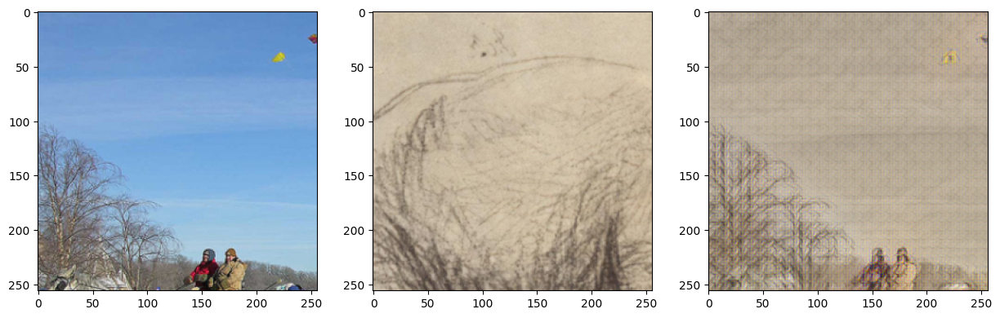

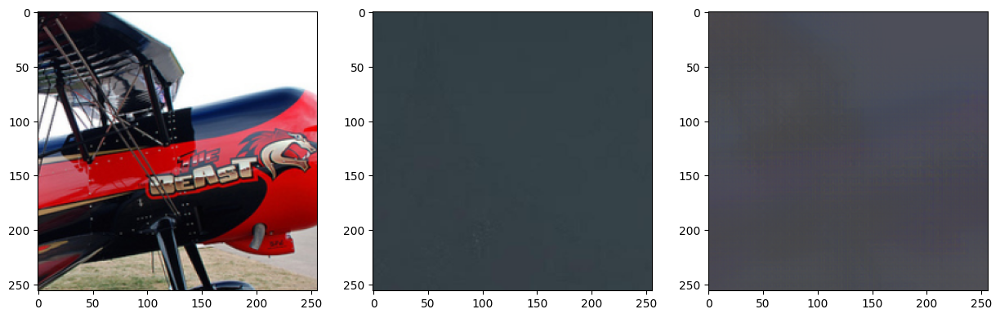

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-60..293].


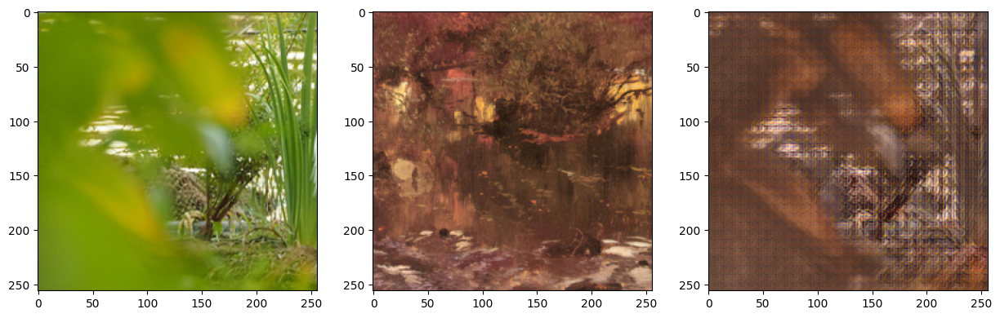

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-26..310].


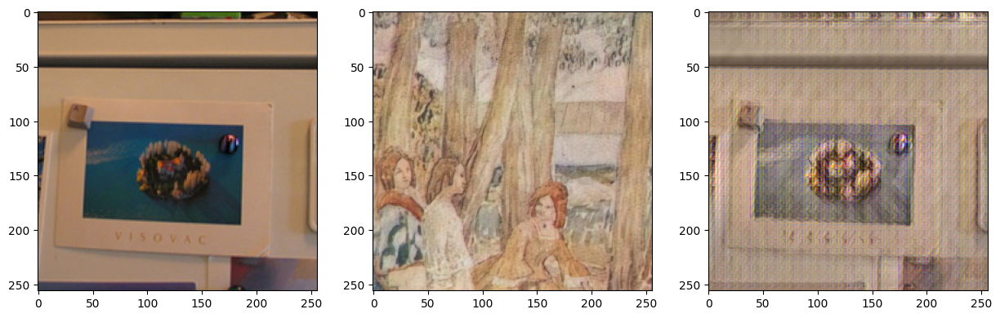

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-74..302].


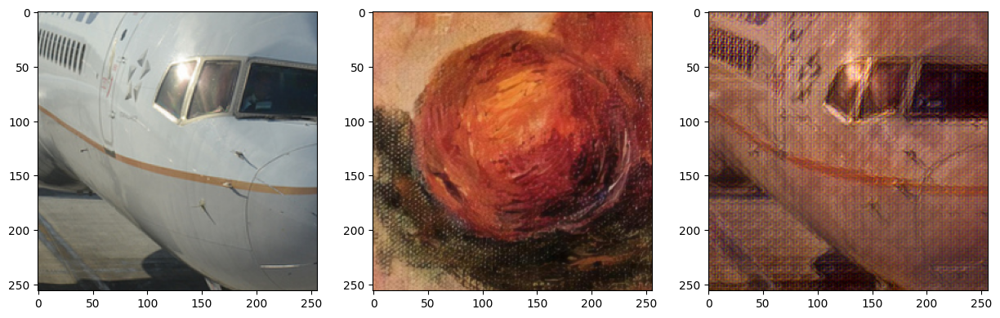

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-60..301].


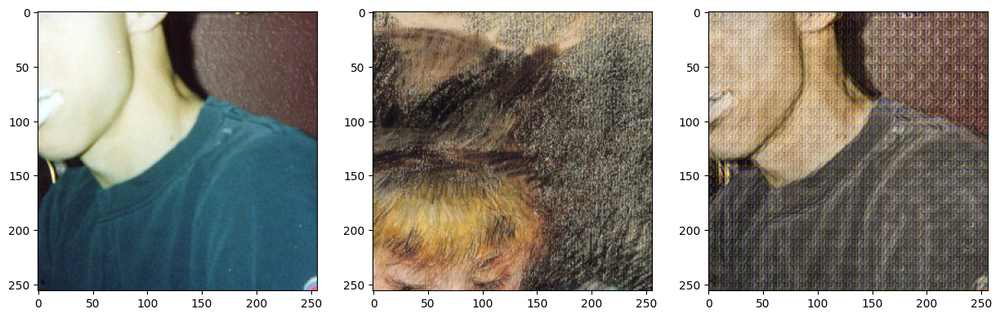

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [15..308].


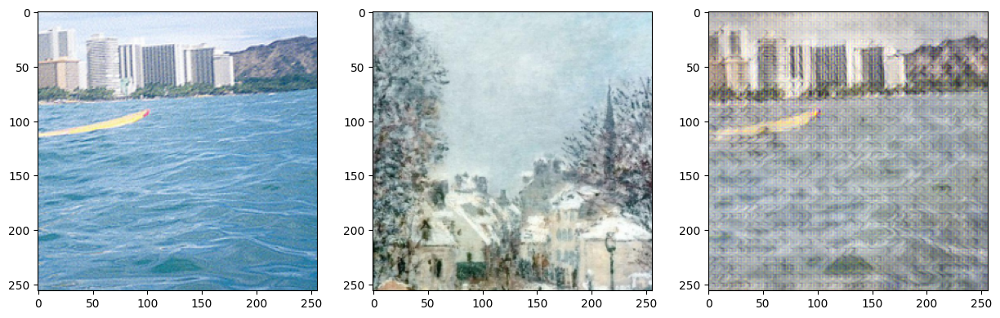

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-94..296].


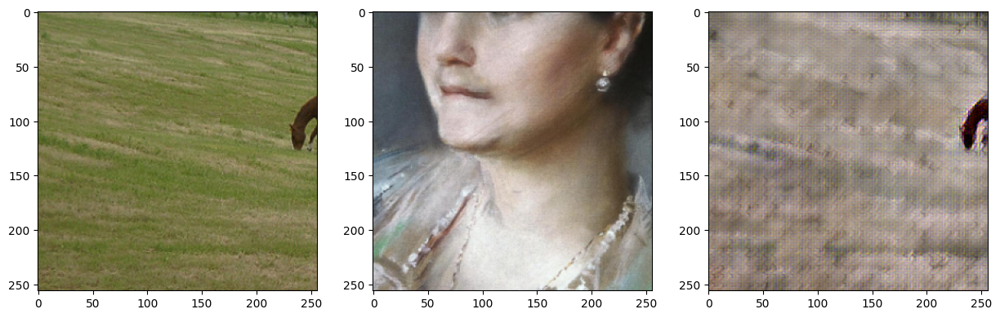

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-187..342].


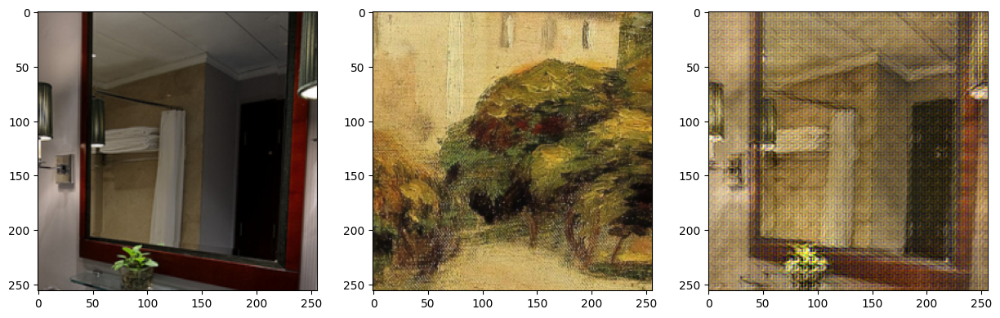

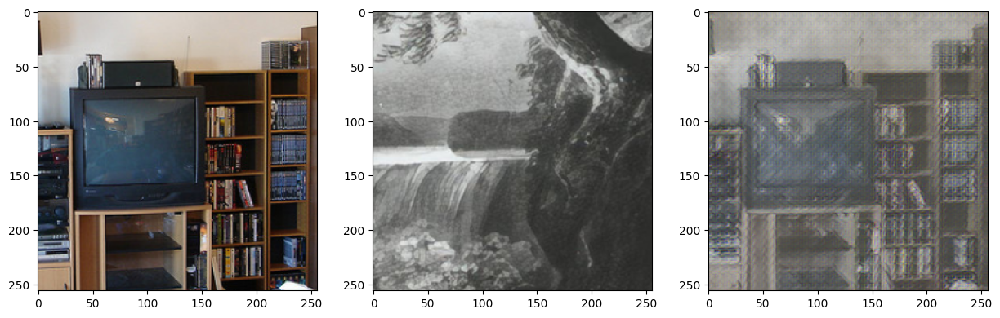

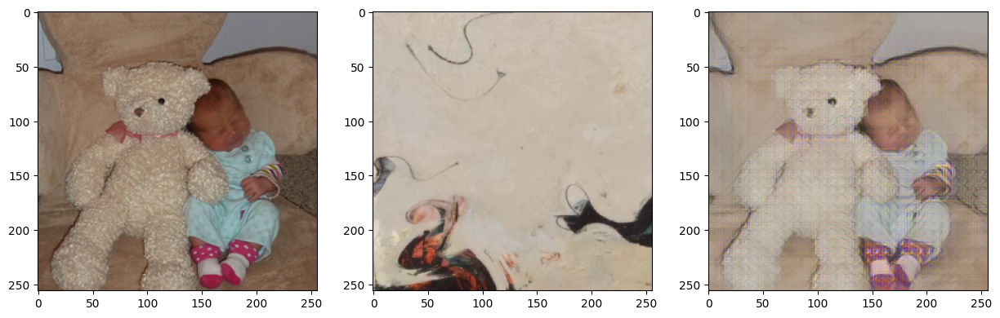

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-35..341].


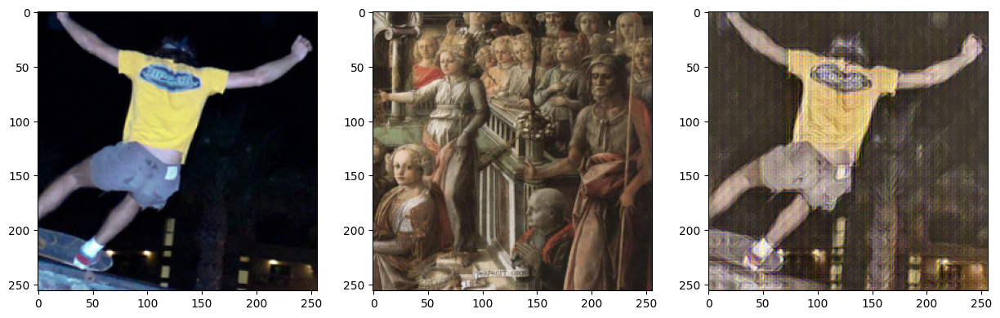

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-144..410].


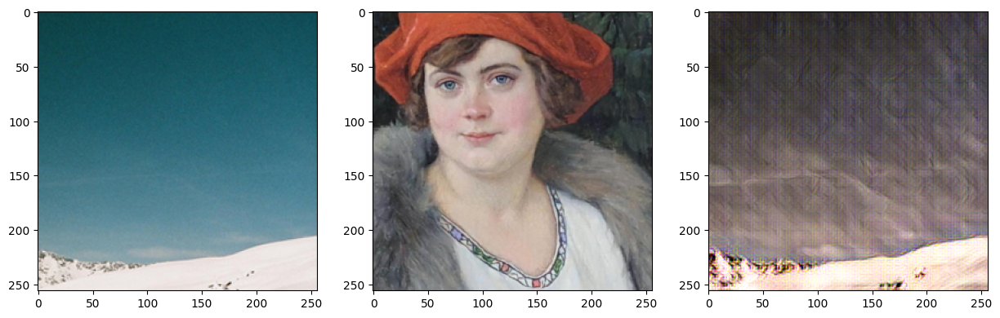

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-150..393].


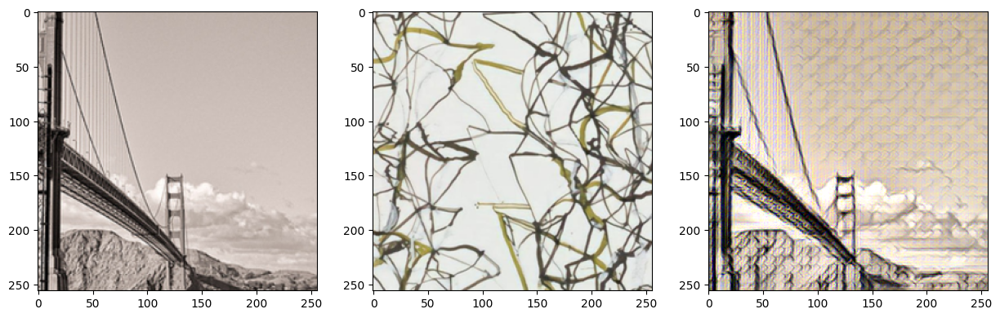

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-50..337].


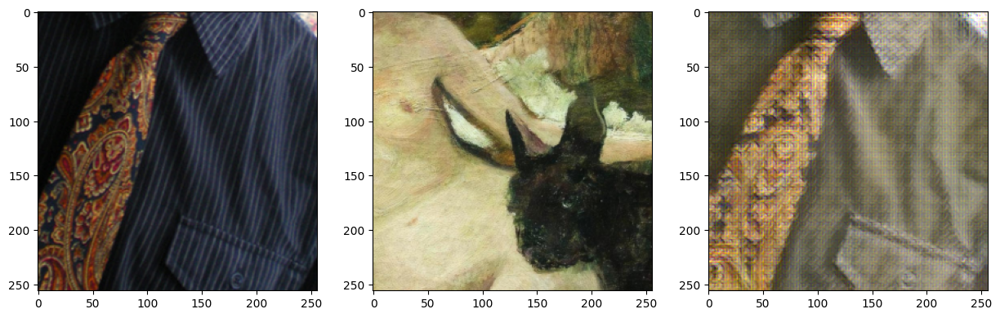

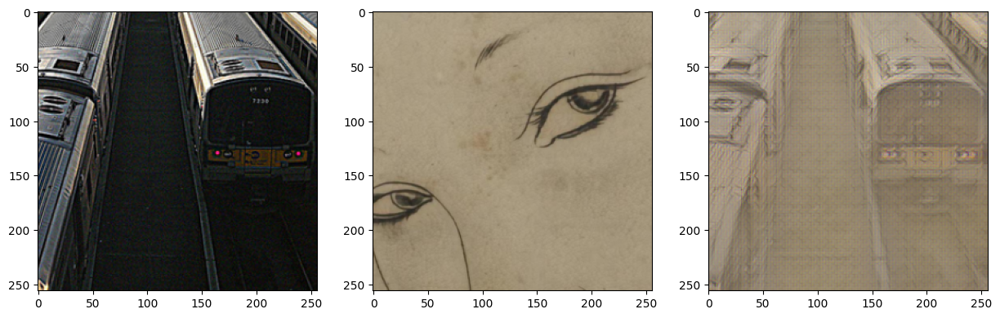

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [4..256].


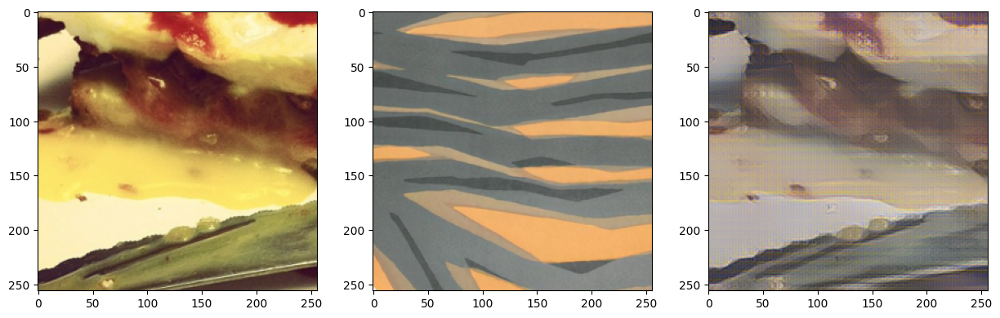

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-234..554].


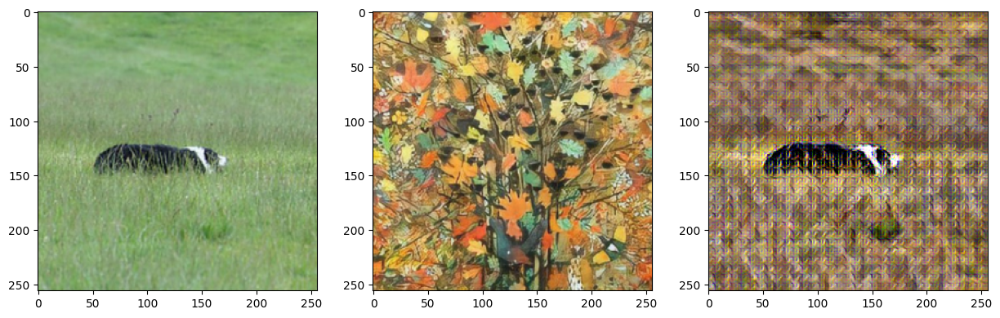

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-50..321].


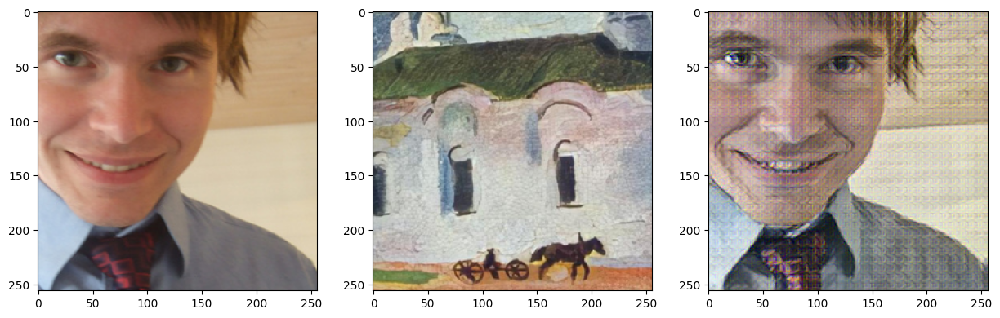

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-30..198].


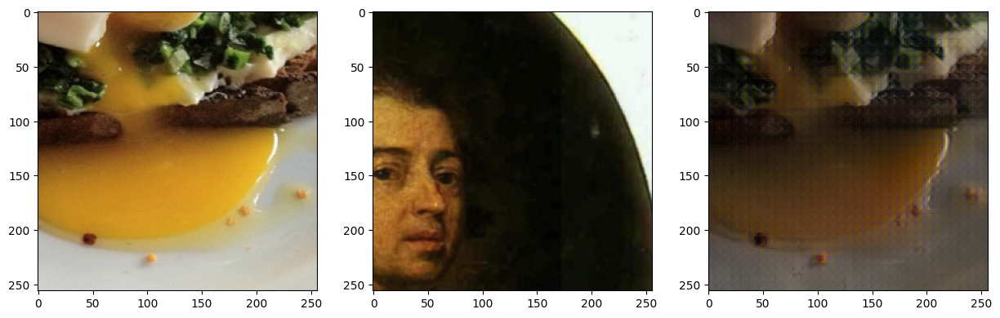

In [6]:
import matplotlib.pyplot as plt

for gen in imgs :
    fig, axs = plt.subplots(1,3, figsize=(15,5))
    for i in range(3) :
        axs[i].imshow(gen[i])
    plt.show()